## 0. Imports

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from scipy import stats
from scipy.stats import pearsonr, spearmanr, ttest_rel, ttest_ind
import os

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay
from tqdm import tqdm

# import torchvision.transforms as transforms
# from torchvision.datasets import ImageFolder
# from torch.utils.data import DataLoader, ConcatDataset
# import matplotlib.pyplot as plt
# import torch
# from torch.utils.data import Dataset
# from PIL import Image
# import matplotlib.pyplot as plt
# import torchvision
# from torchvision.datasets import DatasetFolder
# import torch.nn as nn
# import torch.optim as optim
# import torch.nn.functional as F

# import sys
# import pkg_resources

In [2]:
# Чтобы не вылетала ошибка Kernel Error при построении графиков в matplotlib
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

In [3]:
# torch.manual_seed(42)
np.random.seed(42)
# random.seed(42)

## 1. Load dataset

In [4]:
df_metrics = pd.read_csv("./src/df_metrics_v4.csv")

In [5]:
df_metrics.head(5)

,image_path,generator,real_or_fake,fire_output,fire_reconstruction,blip_output,blip_reconstruction,clip_score
0,/kaggle/input/tiny-genimage/imagenet_ai_0419_b...,biggan,0,4.787818,0.850193,5.367271,0.852405,22.692135
1,/kaggle/input/tiny-genimage/imagenet_ai_0419_b...,biggan,0,4.357296,0.827151,5.302590,0.830180,24.296736
2,/kaggle/input/tiny-genimage/imagenet_ai_0419_b...,biggan,0,6.202602,0.830518,4.327545,0.833447,23.416561
3,/kaggle/input/tiny-genimage/imagenet_ai_0419_b...,biggan,0,4.997789,0.829408,3.680972,0.832730,22.623251
4,/kaggle/input/tiny-genimage/imagenet_ai_0419_b...,biggan,0,5.609457,0.828616,5.594449,0.831470,21.532219


In [6]:
df_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7000 entries, 0 to 6999
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   image_path           7000 non-null   object 
 1   generator            7000 non-null   object 
 2   real_or_fake         7000 non-null   int64  
 3   fire_output          7000 non-null   float64
 4   fire_reconstruction  7000 non-null   float64
 5   blip_output          7000 non-null   float64
 6   blip_reconstruction  7000 non-null   float64
 7   clip_score           7000 non-null   float64
dtypes: float64(5), int64(1), object(2)
memory usage: 437.6+ KB


## 2. Check general metrics

### 2.1. FIRE-model (baseline)

In [7]:
df_standard = df_metrics[(df_metrics['generator'] != 'wukong') & (df_metrics['generator'] != 'biggan')]

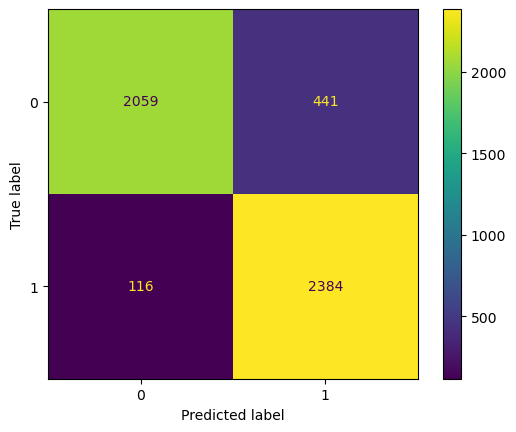

In [8]:
y_true_fire = df_standard['real_or_fake'].to_numpy()
y_pred_fire = (df_standard['fire_output'] > 0).to_numpy().astype(np.float32)

cm = confusion_matrix(y_true_fire, y_pred_fire, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot()

In [9]:
TN_fire, FP_fire, FN_fire, TP_fire = confusion_matrix(y_true_fire, y_pred_fire, labels=[0, 1]).ravel()

accuracy_fire = (TP_fire + TN_fire) / (TN_fire + FP_fire + FN_fire + TP_fire)
precision_fire = TP_fire / (TP_fire + FP_fire) if (TP_fire + FP_fire) > 0 else 0
recall_fire = TP_fire / (TP_fire + FN_fire) if (TP_fire + FN_fire) > 0 else 0
f1_fire = 2 * precision_fire * recall_fire / (precision_fire + recall_fire) if (precision_fire + recall_fire) > 0 else 0

print(f"Accuracy score of FIRE model: {accuracy_score(y_true_fire, y_pred_fire):.4f}")
print(f"Precision score of FIRE model: {precision_score(y_true_fire, y_pred_fire):.4f}")
print(f"Recall score of FIRE model: {recall_score(y_true_fire, y_pred_fire):.4f}")
print(f"F1-score of FIRE model: {f1_score(y_true_fire, y_pred_fire):.4f}")

Accuracy score of FIRE model: 0.8886
Precision score of FIRE model: 0.8439
Recall score of FIRE model: 0.9536
F1-score of FIRE model: 0.8954


In [10]:
# Доверительный интервал для Accuracy (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_accuracy_fire = np.sqrt(accuracy_fire * (1 - accuracy_fire) / (TP_fire + FP_fire + TN_fire + FN_fire))
ci_accuracy_fire = (accuracy_fire - z * se_accuracy_fire, accuracy_fire + z * se_accuracy_fire)
print(f"Accuracy confident interval {100*(ci_accuracy_fire[0]):.2f}% ... {100*(ci_accuracy_fire[1]):.2f}%")

Accuracy confident interval 87.99% ... 89.73%


In [11]:
# Доверительный интервал для Precision (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_precision_fire = np.sqrt(precision_fire * (1 - precision_fire) / (TP_fire + FP_fire))
ci_precision_fire = (precision_fire - z * se_precision_fire, precision_fire + z * se_precision_fire)
print(f"Precision confident interval {100*(ci_precision_fire[0]):.2f}% ... {100*(ci_precision_fire[1]):.2f}%")

Precision confident interval 83.05% ... 85.73%


In [12]:
# Доверительный интервал для Recall (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_recall_fire = np.sqrt(recall_fire * (1 - recall_fire) / (TP_fire + FN_fire))
ci_recall_fire = (recall_fire - z * se_recall_fire, recall_fire + z * se_recall_fire)
print(f"Recall confident interval {100*(ci_recall_fire[0]):.2f}% ... {100*(ci_recall_fire[1]):.2f}%")

Recall confident interval 94.54% ... 96.18%


In [13]:
# Доверительный интервал для F1 (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_f1_fire = np.sqrt( ((2 * recall_fire**2 * se_precision_fire)/(precision_fire + recall_fire)**2)**2 + ((2 * precision_fire**2 * se_recall_fire)/(precision_fire + recall_fire)**2)**2 )
ci_f1_fire = (f1_fire - z * se_f1_fire, f1_fire + z * se_f1_fire)
print(f"F1 confident interval {(ci_f1_fire[0]):.4f} ... {(ci_f1_fire[1]):.4f}")

F1 confident interval 0.8870 ... 0.9038


### 2.2. FIRE+BLIP-model (new)

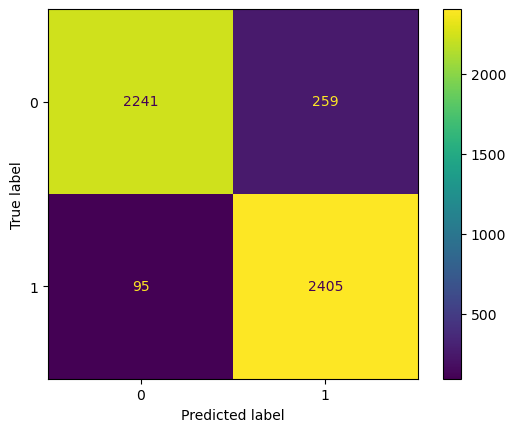

In [14]:
y_true_blip = df_standard['real_or_fake'].to_numpy()
y_pred_blip = (df_standard['blip_output'] > 0).to_numpy().astype(np.float32)

cm = confusion_matrix(y_true_blip, y_pred_blip, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
disp.plot()

In [15]:
TN_blip, FP_blip, FN_blip, TP_blip = confusion_matrix(y_true_blip, y_pred_blip, labels=[0, 1]).ravel()

accuracy_blip = (TP_blip + TN_blip) / (TP_blip + FP_blip + TN_blip + FN_blip)
precision_blip = TP_blip / (TP_blip + FP_blip)
recall_blip = TP_blip / (TP_blip + FN_blip) 
f1_blip = 2 * precision_blip * recall_blip / (precision_blip + recall_blip)

print(f"Accuracy score of FIRE+BLIP model: {accuracy_score(y_true_blip, y_pred_blip):.4f}")
print(f"Precision score of FIRE+BLIP model: {precision_score(y_true_blip, y_pred_blip):.4f}")
print(f"Recall score of FIRE+BLIP model: {recall_score(y_true_blip, y_pred_blip):.4f}")
print(f"F1-score of FIRE+BLIP model: {f1_score(y_true_blip, y_pred_blip):.4f}")

Accuracy score of FIRE+BLIP model: 0.9292
Precision score of FIRE+BLIP model: 0.9028
Recall score of FIRE+BLIP model: 0.9620
F1-score of FIRE+BLIP model: 0.9314


In [16]:
# Доверительный интервал для Accuracy (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_accuracy_blip = np.sqrt(accuracy_blip * (1 - accuracy_blip) / (TP_blip + FP_blip + TN_blip + FN_blip))
ci_accuracy_blip = (accuracy_blip - z * se_accuracy_blip, accuracy_blip + z * se_accuracy_blip)
print(f"Accuracy confident interval {100*(ci_accuracy_blip[0]):.2f}% ... {100*(ci_accuracy_blip[1]):.2f}%")

Accuracy confident interval 92.21% ... 93.63%


In [17]:
# Доверительный интервал для Precision (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_precision_blip = np.sqrt(precision_blip * (1 - precision_blip) / (TP_blip + FP_blip))
ci_precision_blip = (precision_blip - z * se_precision_blip, precision_blip + z * se_precision_blip)
print(f"Precision confident interval {100*(ci_precision_blip[0]):.2f}% ... {100*(ci_precision_blip[1]):.2f}%")

Precision confident interval 89.15% ... 91.40%


In [18]:
# Доверительный интервал для Recall (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_recall_blip = np.sqrt(recall_blip * (1 - recall_blip) / (TP_blip + FN_blip))
ci_recall_blip = (recall_blip - z * se_recall_blip, recall_blip + z * se_recall_blip)
print(f"Recall confident interval {100*(ci_recall_blip[0]):.2f}% ... {100*(ci_recall_blip[1]):.2f}%")

Recall confident interval 95.45% ... 96.95%


In [19]:
# Доверительный интервал для F1 (Wald)
z = stats.norm.ppf(0.975)  # 1.96 для 95% интервала
se_f1_blip = np.sqrt( ((2 * recall_blip**2 * se_precision_blip)/(precision_blip + recall_blip)**2)**2 + ((2 * precision_blip**2 * se_recall_blip)/(precision_blip + recall_blip)**2)**2 )
ci_f1_blip = (f1_blip - z * se_f1_blip, f1_blip + z * se_f1_blip)
print(f"F1 confident interval {(ci_f1_blip[0]):.4f} ... {(ci_f1_blip[1]):.4f}")

F1 confident interval 0.9245 ... 0.9384


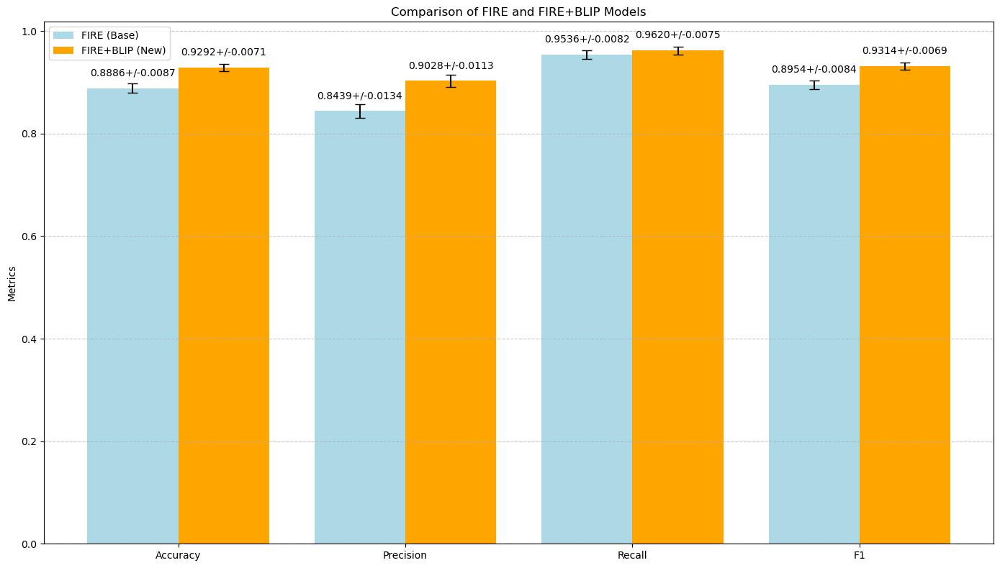

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Данные для моделей
metrics = ['Accuracy', 'Precision', 'Recall', 'F1']
fire_model = {
    'mean': [accuracy_fire, precision_fire, recall_fire, f1_fire],
    'interval': [z*se_accuracy_fire, z*se_precision_fire, z*se_recall_fire, z*se_f1_fire] 
}
fire_blip_model = {
    'mean': [accuracy_blip, precision_blip, recall_blip, f1_blip],
    'interval': [z*se_accuracy_blip, z*se_precision_blip, z*se_recall_blip, z*se_f1_blip]
}

x = np.arange(len(metrics))  # Позиции метрик на оси x
width = 0.4  # Ширина столбцов

# Построение графика
fig, ax = plt.subplots(figsize=(14, 8))

# Графики для моделей FIRE и FIRE+BLIP
bars1 = ax.bar(x - width/2, fire_model['mean'], width, yerr=fire_model['interval'], capsize=5, label='FIRE (Base)', color='lightblue')
bars2 = ax.bar(x + width/2, fire_blip_model['mean'], width, yerr=fire_blip_model['interval'], capsize=5, label='FIRE+BLIP (New)', color='orange')

# Добавление подписей и оформления
ax.set_ylabel('Metrics')
ax.set_title('Comparison of FIRE and FIRE+BLIP Models')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Подписи значений над столбиками
def add_labels(bars, values):
    for bar, value in zip(bars, values):
        height = bar.get_height()
        # ax.text(bar.get_x() + bar.get_width() / 2, height + 0.02, f'{value:.4f}', ha='center', va='bottom')
        ax.text(bar.get_x() + bar.get_width() / 2, height + 0.02, value, ha='center', va='bottom')

title_fire = [str(f"{fire_model['mean'][i]:.4f}") + "+/-" + str(f"{fire_model['interval'][i]:.4f}") for i in range(4)]
title_blip = [str(f"{fire_blip_model['mean'][i]:.4f}") + "+/-" + str(f"{fire_blip_model['interval'][i]:.4f}") for i in range(4)]

# add_labels(bars1, fire_model['mean'])
# add_labels(bars2, fire_blip_model['mean'])

add_labels(bars1, title_fire)
add_labels(bars2, title_blip)

# Показ графика
plt.tight_layout()
plt.show()

## 3. Correlation analysis

In [21]:
df_corr = df_metrics[(df_metrics['generator'] != 'wukong') & (df_metrics['generator'] != 'biggan')].copy()

In [22]:
def get_delta_output(fire_output, blip_output, label_true):
    if (blip_output >= 0 and fire_output >= 0 and label_true == 1.0) or (blip_output < 0 and fire_output < 0 and label_true == 0.0):
        return np.abs(blip_output) - np.abs(fire_output)
    elif (blip_output >= 0 and fire_output >= 0 and label_true == 0.0) or (blip_output < 0 and fire_output < 0 and label_true == 1.0):
        return -(np.abs(blip_output) - np.abs(fire_output))
    elif (blip_output >= 0 and fire_output < 0 and label_true == 1.0) or (blip_output < 0 and fire_output >= 0 and label_true == 0.0):
        return np.abs(blip_output) + np.abs(fire_output)
    elif (blip_output >= 0 and fire_output < 0 and label_true == 0.0) or (blip_output < 0 and fire_output >= 0 and label_true == 1.0):
        return -(np.abs(blip_output) + np.abs(fire_output))

In [23]:
df_corr['delta_output'] = df_corr.apply(lambda x: get_delta_output(x['fire_output'], x['blip_output'], x['real_or_fake']), axis=1)
df_corr['delta_reconstruction'] = df_corr['blip_reconstruction'] - df_corr['fire_reconstruction']

In [24]:
df_corr.sample(10)

,image_path,generator,real_or_fake,fire_output,fire_reconstruction,blip_output,blip_reconstruction,clip_score,delta_output,delta_reconstruction
2501,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.175599,0.505508,-5.357580,0.509014,21.218147,1.181981,0.003506
4086,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,2.443825,0.328773,0.571309,0.326830,22.113846,-1.872516,-0.001943
4153,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,5.867400,0.289018,3.044160,0.291276,21.181374,-2.823240,0.002257
2055,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-3.081965,0.434048,-2.967042,0.437237,17.702866,-0.114924,0.003189
1205,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,1.610645,0.619834,-1.723194,0.597266,22.280502,3.333840,-0.022568
606,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-3.808682,1.232443,-2.839801,1.233522,22.854073,-0.968881,0.001079
1089,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.506803,0.849767,-4.580421,0.843531,23.000288,5.087225,-0.006235
3468,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-4.860381,0.171872,-3.949986,0.172805,19.581750,-0.910395,0.000933
3413,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-1.762528,0.340456,-0.149046,0.339418,20.219444,-1.613482,-0.001039
2600,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-1.510473,0.154580,-2.927276,0.159019,25.073433,1.416804,0.004439


In [125]:
df_standard[df_standard['image']]

,image_path,generator,real_or_fake,fire_output,fire_reconstruction,blip_output,blip_reconstruction,clip_score
4001,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,6.634229,0.548556,5.348439,0.546945,21.307764
6086,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,2.461039,0.314405,6.464979,0.317304,22.227148
6153,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,0.632392,0.073957,5.855239,0.075309,24.956135
3055,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-1.435291,0.524248,-3.281551,0.526149,23.083874
2205,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-6.392448,0.488048,-5.361558,0.491036,24.447096
1106,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-7.329561,0.483808,-4.483876,0.487752,24.010572
2089,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-6.401437,0.349678,-5.918970,0.352975,22.845621
4968,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,3.112234,0.209818,2.102763,0.209065,22.468277
4913,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,4.738338,0.422171,5.348717,0.425581,20.950806
4100,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,4.889911,0.360326,5.762207,0.365831,24.741228


### 3.1. Корреляция увеличения метрики от качества оценки

<Axes: xlabel='clip_score', ylabel='delta_output'>

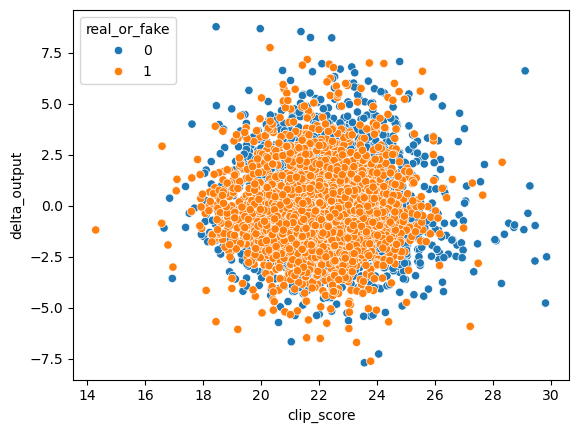

In [25]:
sns.scatterplot(data=df_corr, x="clip_score", y="delta_output", hue="real_or_fake")

#### 3.1.1. Общая

In [26]:
r_statistic, pvalue = pearsonr(df_corr['clip_score'], df_corr['delta_output'])

In [27]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.6725 -> Нет оснований отвергнуть H0 - корреляции нет


In [28]:
r_statistic, pvalue = spearmanr(df_corr['clip_score'], df_corr['delta_output'])

In [29]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.8792 -> Нет оснований отвергнуть H0 - корреляции нет


#### 3.1.2. По классам

In [30]:
df_corr_real, df_corr_fake = df_corr[df_corr['real_or_fake'] == 1.0], df_corr[df_corr['real_or_fake'] == 0.0]

In [31]:
r_statistic, pvalue = pearsonr(df_corr_real['clip_score'], df_corr_real['delta_output'])

In [32]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.2651 -> Нет оснований отвергнуть H0 - корреляции нет


In [33]:
r_statistic, pvalue = pearsonr(df_corr_fake['clip_score'], df_corr_fake['delta_output'])

In [34]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0201 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.046487198537819026


### 3.2. Корреляция изменения ошибки реконструкции от качества оценки

<Axes: xlabel='clip_score', ylabel='delta_reconstruction'>

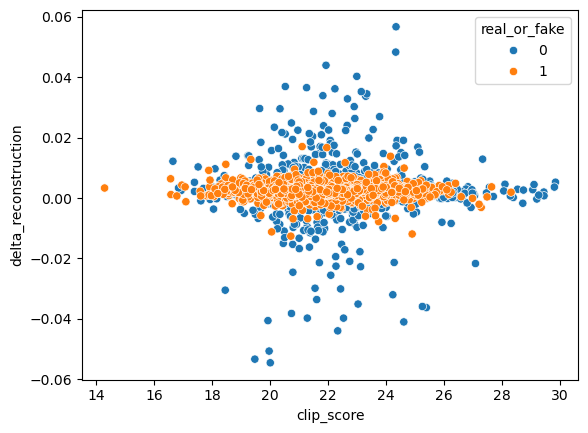

In [35]:
sns.scatterplot(data=df_corr, x="clip_score", y="delta_reconstruction", hue="real_or_fake")

#### 3.2.1. Общая

In [36]:
r_statistic, pvalue = pearsonr(df_corr['clip_score'], df_corr['delta_reconstruction'])

In [37]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0832 -> Нет оснований отвергнуть H0 - корреляции нет


In [38]:
r_statistic, pvalue = stats.spearmanr(df_corr['clip_score'], df_corr['delta_reconstruction'])

In [39]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.08569933180944965


#### 3.2.2. По классам

In [40]:
r_statistic, pvalue = pearsonr(df_corr_real['clip_score'], df_corr_real['delta_reconstruction'])

In [41]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0099 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.051591035659458814


In [42]:
r_statistic, pvalue = pearsonr(df_corr_fake['clip_score'], df_corr_fake['delta_reconstruction'])

In [43]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.3738 -> Нет оснований отвергнуть H0 - корреляции нет


### 3.3. Корреляция увеличения метрики от изменения ошибки реконструкции

<Axes: xlabel='delta_reconstruction', ylabel='delta_output'>

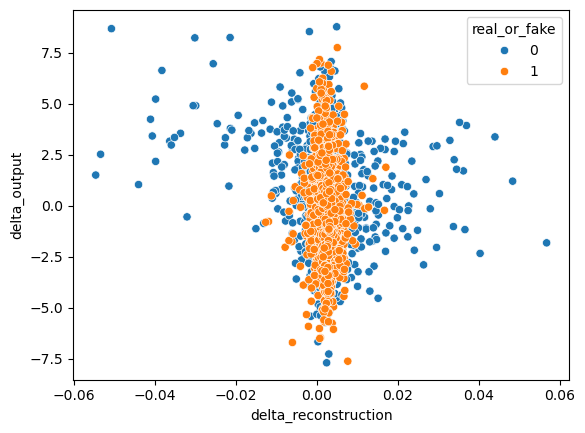

In [44]:
sns.scatterplot(data=df_corr, x="delta_reconstruction", y="delta_output", hue="real_or_fake")

#### 3.3.1. Общая

In [45]:
r_statistic, pvalue = pearsonr(df_corr['delta_reconstruction'], df_corr['delta_output'])

In [46]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.10438838904702122


In [47]:
r_statistic, pvalue = spearmanr(df_corr['delta_reconstruction'], df_corr['delta_output'])

In [48]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0052 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.03954879592188443


#### 3.3.2. По классам

In [49]:
r_statistic, pvalue = pearsonr(df_corr_real['delta_reconstruction'], df_corr_real['delta_output'])

In [50]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0969 -> Нет оснований отвергнуть H0 - корреляции нет


In [51]:
r_statistic, pvalue = pearsonr(df_corr_fake['delta_reconstruction'], df_corr_fake['delta_output'])

In [52]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.13429110521037846


### 3.4. Корреляция выходного сигнала от ошибки реконструкции

<Axes: xlabel='fire_reconstruction', ylabel='fire_output'>

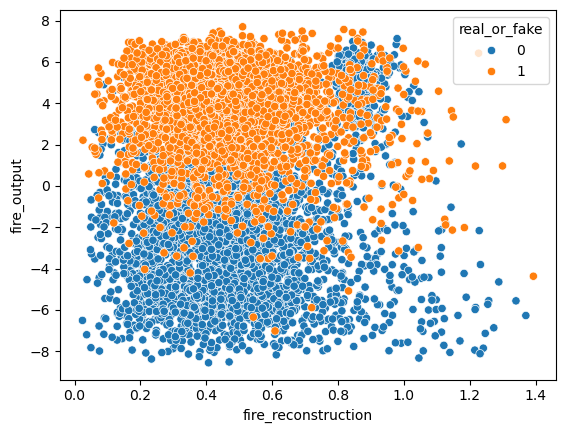

In [137]:
sns.scatterplot(data=df_metrics, x="fire_reconstruction", y="fire_output", hue="real_or_fake")

<Axes: xlabel='blip_reconstruction', ylabel='blip_output'>

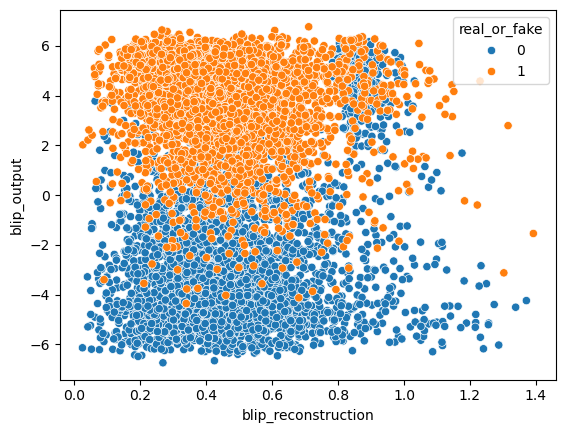

In [138]:
sns.scatterplot(data=df_metrics, x="blip_reconstruction", y="blip_output", hue="real_or_fake")

In [139]:
r_statistic, pvalue = pearsonr(df_metrics['fire_reconstruction'], df_metrics['fire_output'])

In [140]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = 0.06251289496826343


In [141]:
r_statistic, pvalue = pearsonr(df_metrics['blip_reconstruction'], df_metrics['blip_output'])

In [142]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = 0.0934820427083271


### 3.5. Корреляция выходного сигнала от качества оценки описания CLIP

<Axes: xlabel='clip_score', ylabel='blip_output'>

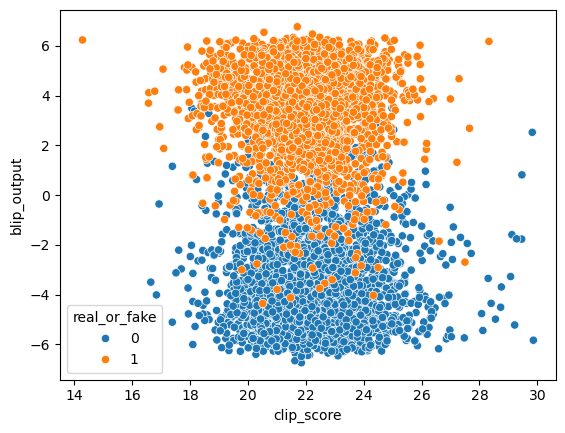

In [132]:
sns.scatterplot(data=df_standard, x="clip_score", y="blip_output", hue="real_or_fake")

In [135]:
r_statistic, pvalue = pearsonr(df_standard['clip_score'], df_standard['blip_output'])

In [136]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = {r_statistic}')
else:
    print(f'Нет оснований отвергнуть H0 - корреляции нет')

pvalue = 0.0000 -> Отвергаем H0 (отсутсвие корреляции), следовательно корреляция существует, r = -0.08673058325793223


## 4. Efficiency comparison for different Generators

In [62]:
generator_list = df_metrics['generator'].unique()
accuracy_list = []

In [63]:
for gen in generator_list:
    y_true_fire = df_metrics[df_metrics['generator'] == gen]['real_or_fake'].to_numpy()
    y_pred_fire = (df_metrics[df_metrics['generator'] == gen]['fire_output'] > 0).to_numpy().astype(np.float32)
    accuracy_fire = accuracy_score(y_true_fire, y_pred_fire)
    ci_accuracy_fire = (stats.norm.ppf(0.975) * np.sqrt(accuracy_fire * (1 - accuracy_fire) / (len(y_true_fire)))).astype(np.float32)
    
    y_true_blip = df_metrics[df_metrics['generator'] == gen]['real_or_fake'].to_numpy()
    y_pred_blip = (df_metrics[df_metrics['generator'] == gen]['blip_output'] > 0).to_numpy().astype(np.float32)
    accuracy_blip = accuracy_score(y_true_blip, y_pred_blip)
    ci_accuracy_blip = (stats.norm.ppf(0.975) * np.sqrt(accuracy_blip * (1 - accuracy_blip) / (len(y_true_blip)))).astype(np.float32)
    
    accuracy_list.append({'generator': gen, 'model': 'FIRE', 'accuracy': accuracy_fire, 'ci': ci_accuracy_fire})
    accuracy_list.append({'generator': gen, 'model': 'FIRE+BLIP', 'accuracy': accuracy_blip, 'ci': ci_accuracy_blip})

In [64]:
accuracy_df = pd.DataFrame(accuracy_list)
accuracy_df

,generator,model,accuracy,ci
0,biggan,FIRE,0.479,0.030962
1,biggan,FIRE+BLIP,0.482,0.030970
2,vqdm,FIRE,0.829,0.023336
3,vqdm,FIRE+BLIP,0.906,0.018087
4,sdv5,FIRE,0.847,0.022312
5,sdv5,FIRE+BLIP,0.933,0.015496
6,wukong,FIRE,0.816,0.024016
7,wukong,FIRE+BLIP,0.888,0.019546
8,adm,FIRE,0.970,0.010573
9,adm,FIRE+BLIP,0.983,0.008012


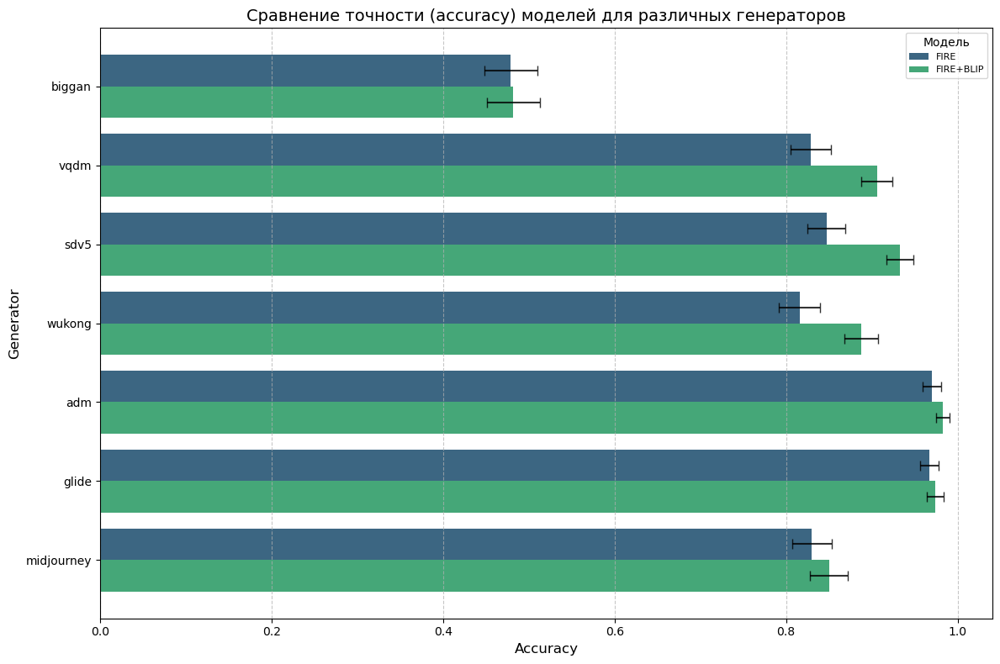

In [65]:
plt.figure(figsize=(12, 8))
sns.barplot(data=accuracy_df, 
            x='accuracy', 
            y='generator', 
            hue='model', 
            errorbar=None,
            palette='viridis')

iterator = iter([-1, 1] * len(generator_list))

# Добавляем доверительные интервалы
for i, row in accuracy_df.iterrows():
    plt.errorbar(
        x=row['accuracy'],
        y=i // 2 + next(iterator) * 0.2, # позиция на оси y, группировка каждые 2 строки
        xerr=row['ci'],
        fmt='none',
        c='black',
        capsize=4,
        alpha=0.8
    )

# Настройка графика
plt.title('Сравнение точности (accuracy) моделей для различных генераторов', fontsize=14)
plt.xlabel('Accuracy', fontsize=12)
plt.ylabel('Generator', fontsize=12)
# plt.legend(title='Тип Accuracy', labels=['Fire', 'Blip'], fontsize=10)
plt.legend(title='Модель', fontsize=8)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Отображение графика
plt.tight_layout()
plt.show()

In [66]:
accuracy_df.groupby(['generator', 'model'])[['accuracy', 'ci']].sum()

accuracy        ci
generator  model                        
adm        FIRE          0.970  0.010573
           FIRE+BLIP     0.983  0.008012
biggan     FIRE          0.479  0.030962
           FIRE+BLIP     0.482  0.030970
glide      FIRE          0.967  0.011072
           FIRE+BLIP     0.974  0.009863
midjourney FIRE          0.830  0.023282
           FIRE+BLIP     0.850  0.022131
sdv5       FIRE          0.847  0.022312
           FIRE+BLIP     0.933  0.015496
vqdm       FIRE          0.829  0.023336
           FIRE+BLIP     0.906  0.018087
wukong     FIRE          0.816  0.024016
           FIRE+BLIP     0.888  0.019546

## 5. Histogramms of both models

### 5.1 Histogramms of reconstruction errors

In [67]:
df_standard = df_metrics[(df_metrics['generator'] != 'wukong') & (df_metrics['generator'] != 'biggan')]

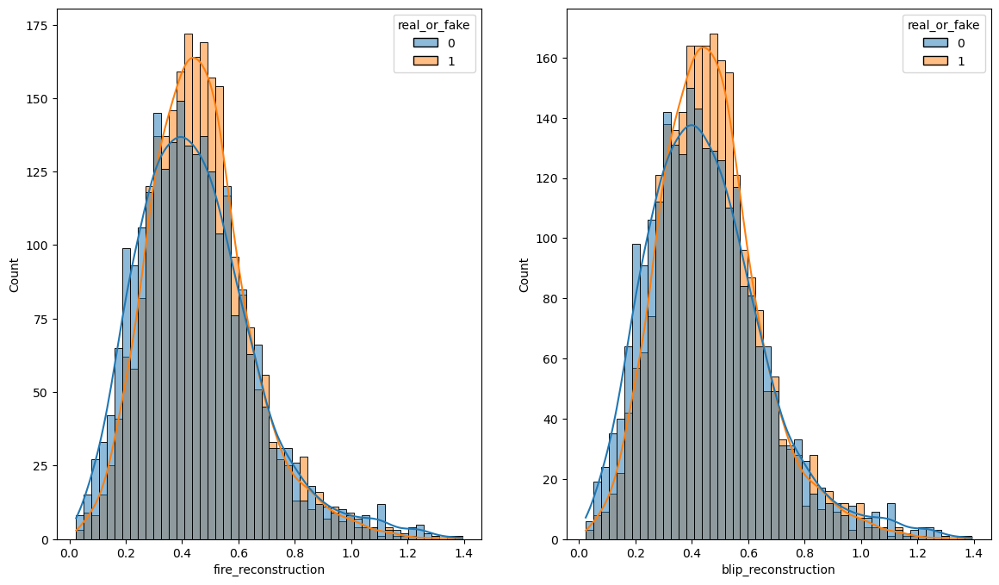

In [68]:
fig, ax = plt.subplots(1, 2, figsize=(14, 8))
sns.histplot(data=df_standard, x="fire_reconstruction", hue="real_or_fake", bins=50, kde=True, ax=ax[0])
sns.histplot(data=df_standard, x="blip_reconstruction", hue="real_or_fake", bins=50, kde=True, ax=ax[1])
plt.show()

In [69]:
df_standard.groupby('real_or_fake')['fire_reconstruction'].agg(['mean', 'std'])

,mean,std
real_or_fake,,
0,0.449809,0.210621
1,0.461890,0.178919


In [70]:
df_standard.groupby('real_or_fake')['blip_reconstruction'].agg(['mean', 'std'])

,mean,std
real_or_fake,,
0,0.452025,0.210815
1,0.464262,0.179068


In [71]:
print(f"Изменение средней ошибки реконструкции для РЕАЛЬНЫХ изображений = {(df_standard.groupby('real_or_fake')['blip_reconstruction'].mean()[1] - df_standard.groupby('real_or_fake')['fire_reconstruction'].mean()[1]):.6f}")
print(f"Изменение средней ошибки реконструкции для СГЕНЕРИРОВАННЫХ изображений = {(df_standard.groupby('real_or_fake')['blip_reconstruction'].mean()[0] - df_standard.groupby('real_or_fake')['fire_reconstruction'].mean()[0]):.6f}")

Изменение средней ошибки реконструкции для РЕАЛЬНЫХ изображений = 0.002372
Изменение средней ошибки реконструкции для СГЕНЕРИРОВАННЫХ изображений = 0.002217


In [72]:
statistic, pvalue = ttest_rel(df_standard[df_standard['real_or_fake'] == 0.0]['fire_reconstruction'], df_standard[df_standard['real_or_fake'] == 0.0]['blip_reconstruction'])

In [73]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились')
else:
    print(f'Нет оснований отвергнуть H0 - средние не изменились')

pvalue = 0.0000 -> Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились


In [74]:
statistic, pvalue = ttest_rel(df_standard[df_standard['real_or_fake'] == 1.0]['fire_reconstruction'], df_standard[df_standard['real_or_fake'] == 1.0]['blip_reconstruction'])

In [75]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились')
else:
    print(f'Нет оснований отвергнуть H0 - средние не изменились')

pvalue = 0.0000 -> Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились


### 5.2 Histogramms of CLIPScores

<Axes: xlabel='clip_score', ylabel='Count'>

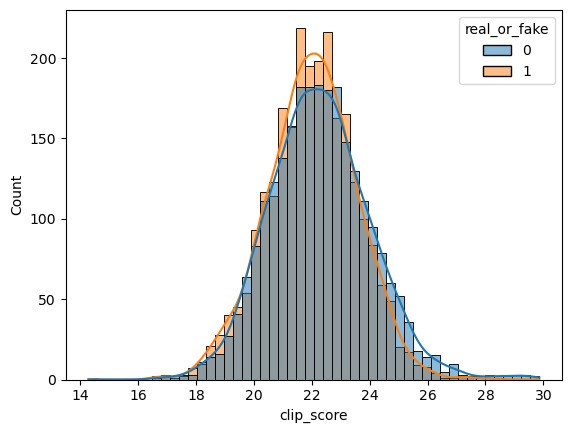

In [76]:
sns.histplot(data=df_standard, x="clip_score", hue="real_or_fake", bins=50, kde=True)

In [77]:
df_standard.groupby('real_or_fake')['clip_score'].agg(['mean', 'std'])

,mean,std
real_or_fake,,
0,22.287999,1.747532
1,22.001374,1.559287


In [78]:
statistic, pvalue = ttest_ind(df_standard[df_standard['real_or_fake'] == 1.0]['clip_score'], df_standard[df_standard['real_or_fake'] == 0.0]['clip_score'])

In [79]:
print(f"pvalue = {pvalue:.4f} -> ", end='')
if pvalue < 0.05:
    print(f'Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились')
else:
    print(f'Нет оснований отвергнуть H0 - средние не изменились')

pvalue = 0.0000 -> Отвергаем H0 (средние не изменились) как противоречую экспериментальным данным, следовательно, средние изменились


<Axes: xlabel='delta_reconstruction', ylabel='Count'>

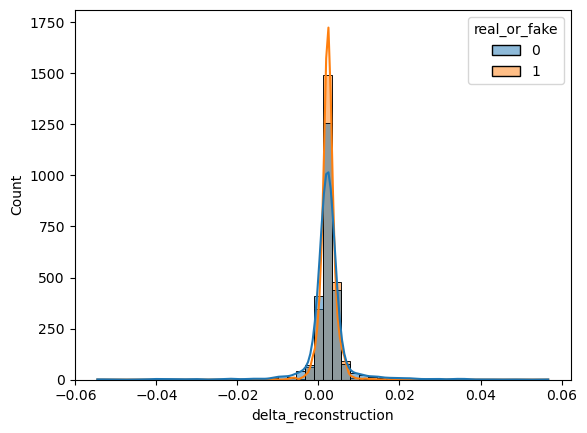

In [80]:
sns.histplot(data=df_corr, x="delta_reconstruction", hue="real_or_fake", bins=50, kde=True)

In [81]:
df_corr.groupby('real_or_fake')['delta_reconstruction'].agg(['mean', 'std'])

,mean,std
real_or_fake,,
0,0.002217,0.005966
1,0.002372,0.001902


## 6. Visualization of models inference

### 6.1 Reconstruction errors (max/min)

In [82]:
def plot_pictures(df, root_path='./dataset_tiny_genimage', col=5):
    df["image_path"]= df.apply(lambda x: x['image_path'].replace('/kaggle/input/tiny-genimage', root_path), axis=1)
    fig, axes = plt.subplots(1, col, figsize=(30, 6))

    for i in range(col):
        img = cv2.imread(df["image_path"].iloc[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[i].imshow(img)
        axes[i].set_title(f'{df["generator"].iloc[i]}, isReal = {df["real_or_fake"].iloc[i].astype(np.bool)}')
        axes[i].grid(False)
        axes[i].axis('off')
    
    plt.show()

In [83]:
df_standard = df_metrics[(df_metrics['generator'] != 'wukong') & (df_metrics['generator'] != 'biggan')]

In [84]:
df_fire_10min = df_standard.sort_values(by=['fire_reconstruction'])[['image_path', 'generator', 'real_or_fake', 'fire_output', 'fire_reconstruction']].iloc[:10]
df_fire_10min

,image_path,generator,real_or_fake,fire_output,fire_reconstruction
2888,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.511193,0.023859
4534,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,2.210414,0.025439
2381,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-7.203647,0.036662
2983,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.538491,0.037654
5696,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,5.252500,0.039863
6843,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,0.576756,0.042936
2857,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-3.091902,0.048194
769,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-1.989384,0.049222
2417,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-7.830391,0.049583
3405,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-0.677615,0.050108


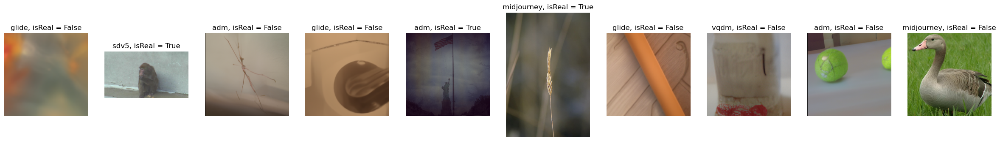

In [85]:
plot_pictures(df_fire_10min, col=10)

In [86]:
df_blip_10min = df_standard.sort_values(by=['blip_reconstruction'])[['image_path', 'generator', 'real_or_fake', 'blip_output', 'blip_reconstruction']].iloc[:10]
df_blip_10min

,image_path,generator,real_or_fake,blip_output,blip_reconstruction
2888,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.138359,0.024390
4534,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,2.019378,0.025509
2983,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-3.286376,0.039413
2381,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-5.298045,0.040846
5696,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,2.212353,0.041096
6843,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,2.617080,0.043959
769,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-5.243583,0.048899
2857,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-3.840488,0.049617
2580,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.796583,0.049619
2417,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,-6.194691,0.051764


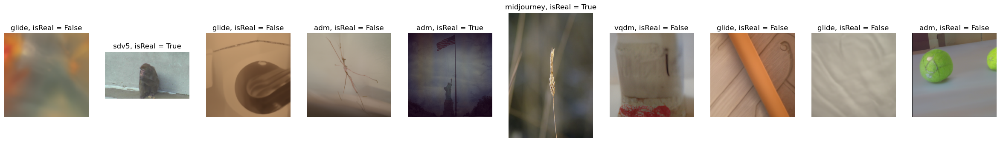

In [87]:
plot_pictures(df_blip_10min, col=10)

In [88]:
df_fire_10max = df_standard.sort_values(by=['fire_reconstruction'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'fire_output', 'fire_reconstruction']].iloc[:10]
df_fire_10max

,image_path,generator,real_or_fake,fire_output,fire_reconstruction
5937,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,-4.373455,1.393209
2544,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.274836,1.370373
2758,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-5.564341,1.340349
6282,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,0.963914,1.299567
2526,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.648652,1.288219
2850,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.868400,1.272991
694,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-5.555120,1.257656
722,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-5.731110,1.254837
2702,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-7.139198,1.247022
2868,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-7.854744,1.241222


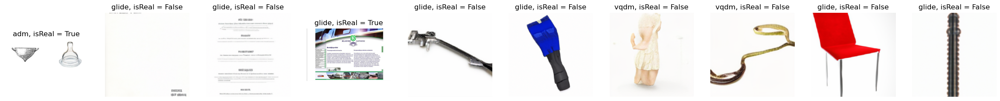

In [89]:
plot_pictures(df_fire_10max, col=10)

In [90]:
df_blip_10max = df_standard.sort_values(by=['blip_reconstruction'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'blip_output', 'blip_reconstruction']].iloc[:10]
df_blip_10max

,image_path,generator,real_or_fake,blip_output,blip_reconstruction
5937,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,-1.544023,1.392360
2544,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.242093,1.371142
2758,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.508022,1.338612
6282,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,-3.126465,1.302800
2526,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.028451,1.287298
2850,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-4.399487,1.273494
694,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-5.147011,1.256861
722,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,-5.210393,1.255719
2702,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-3.563505,1.250035
2868,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-6.178738,1.240931


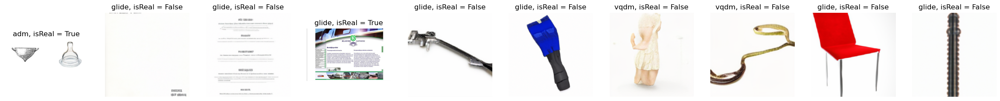

In [91]:
plot_pictures(df_blip_10max, col=10)

In [92]:
df_standard.sort_values(by=['blip_reconstruction'])[['image_path', 'generator', 'real_or_fake', 'fire_reconstruction', 'blip_reconstruction']].iloc[:10]

,image_path,generator,real_or_fake,fire_reconstruction,blip_reconstruction
2888,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,0.023859,0.024390
4534,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,0.025439,0.025509
2983,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,0.037654,0.039413
2381,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,0.036662,0.040846
5696,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,0.039863,0.041096
6843,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,0.042936,0.043959
769,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,0.049222,0.048899
2857,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,0.048194,0.049617
2580,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,0.051249,0.049619
2417,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,0,0.049583,0.051764


In [93]:
df_standard.sort_values(by=['blip_reconstruction'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'fire_reconstruction', 'blip_reconstruction']].iloc[:10]

,image_path,generator,real_or_fake,fire_reconstruction,blip_reconstruction
5937,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,1.393209,1.392360
2544,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.370373,1.371142
2758,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.340349,1.338612
6282,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,1.299567,1.302800
2526,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.288219,1.287298
2850,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.272991,1.273494
694,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,1.257656,1.256861
722,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,1.254837,1.255719
2702,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.247022,1.250035
2868,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,1.241222,1.240931


### 6.2 Delta-Reconstruction errors (max/min)

In [94]:
df_drecon_10min = df_corr.sort_values(by=['delta_reconstruction'])[['image_path', 'generator', 'real_or_fake', 'delta_reconstruction']].iloc[:10]
df_drecon_10min

,image_path,generator,real_or_fake,delta_reconstruction
1248,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.054572
1233,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.053366
1346,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.050696
1206,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.043999
1003,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.041044
1086,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.040610
1077,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.039780
1434,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.039777
1311,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.038234
1031,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,-0.036302


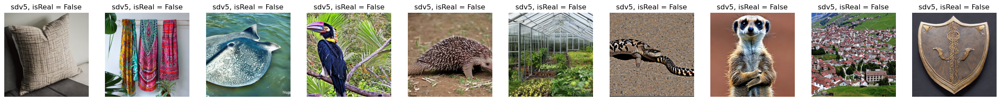

In [95]:
plot_pictures(df_drecon_10min, col=10)

In [96]:
df_drecon_10max = df_corr.sort_values(by=['delta_reconstruction'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'delta_reconstruction']].iloc[:10]
df_drecon_10max

,image_path,generator,real_or_fake,delta_reconstruction
1303,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.056714
1262,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.048331
1079,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.043962
1302,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.040295
1185,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.036931
1194,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.036555
1060,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.036177
1428,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.035233
1343,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.034498
1272,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,0.033895


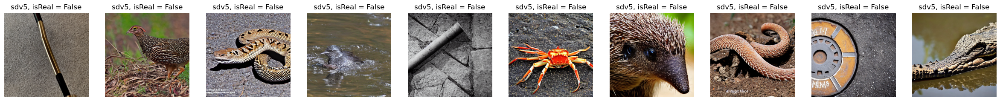

In [97]:
plot_pictures(df_drecon_10max, col=10)

### 6.3 Delta-Output (max/min)

In [98]:
df_deltadout_10min = df_corr.sort_values(by=['delta_output'])[['image_path', 'generator', 'real_or_fake', 'fire_output', 'blip_output', 'delta_output']].iloc[:10]
df_deltadout_10min

,image_path,generator,real_or_fake,fire_output,blip_output,delta_output
2658,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-7.566247,0.122433,-7.688680
4281,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,5.259313,-2.351835,-7.611148
3498,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-6.651055,0.607483,-7.258538
6518,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,5.359326,-1.334660,-6.693986
3026,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-6.594298,0.065057,-6.659355
6368,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,5.712605,-0.784228,-6.496832
4508,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,4.232585,-2.232475,-6.465060
6588,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,5.068865,-0.981266,-6.050131
6230,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,4.730260,-1.280479,-6.010739
6893,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,7.223934,1.318409,-5.905525


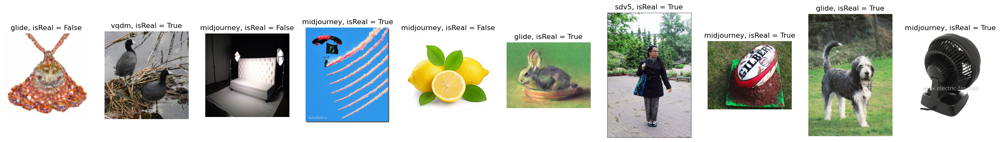

In [99]:
plot_pictures(df_deltadout_10min, col=10)

In [100]:
df_deltadout_10max = df_corr.sort_values(by=['delta_output'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'fire_output', 'blip_output', 'delta_output']].iloc[:10]
df_deltadout_10max

,image_path,generator,real_or_fake,fire_output,blip_output,delta_output
772,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,6.543341,-2.225969,8.769310
1346,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,4.492915,-4.184761,8.677676
3393,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,4.587079,-3.945786,8.532865
1317,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,5.501681,-2.741355,8.243037
1498,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,5.483191,-2.744002,8.227193
4866,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,-1.568592,6.179422,7.748014
5908,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,-7.020276,0.145835,7.166111
973,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,3.295520,-3.772251,7.067771
4389,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,-2.981551,4.014465,6.996017
6120,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,-4.213671,2.756009,6.969680


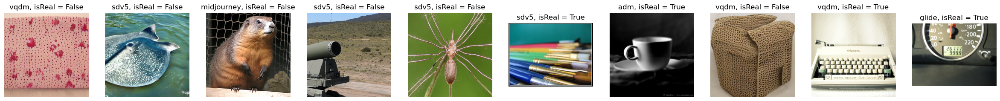

In [101]:
plot_pictures(df_deltadout_10max, col=10)

### 6.4 Classification correction

In [102]:
df_changed_class = df_corr[(np.sign(df_corr['fire_output']) != np.sign(df_corr['blip_output']))]
df_changed_class.info()

<class 'pandas.core.frame.DataFrame'>
Index: 479 entries, 508 to 6965
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   image_path            479 non-null    object 
 1   generator             479 non-null    object 
 2   real_or_fake          479 non-null    int64  
 3   fire_output           479 non-null    float64
 4   fire_reconstruction   479 non-null    float64
 5   blip_output           479 non-null    float64
 6   blip_reconstruction   479 non-null    float64
 7   clip_score            479 non-null    float64
 8   delta_output          479 non-null    float64
 9   delta_reconstruction  479 non-null    float64
dtypes: float64(7), int64(1), object(2)
memory usage: 41.2+ KB


In [103]:
df_changed_class_correct =  df_changed_class[((df_changed_class['blip_output'] >= 0) & (df_changed_class['real_or_fake'] == 1.0)) | ((df_changed_class['blip_output'] < 0) & (df_changed_class['real_or_fake'] == 0.0))]
df_changed_class_incorrect =  df_changed_class[((df_changed_class['blip_output'] >= 0) & (df_changed_class['real_or_fake'] == 0.0)) | ((df_changed_class['blip_output'] < 0) & (df_changed_class['real_or_fake'] == 1.0))]

In [104]:
df_changed_class_correct.shape, df_changed_class_incorrect.shape

((341, 10), (138, 10))

In [105]:
df_changed_class_correct['real_or_fake'].value_counts()

real_or_fake
0    265
1     76
Name: count, dtype: int64

In [106]:
df_changed_class_incorrect['real_or_fake'].value_counts()

real_or_fake
0    83
1    55
Name: count, dtype: int64

In [107]:
df_corrected_10max = df_changed_class_correct.sort_values(by=['delta_output'], ascending=False)[['image_path', 'generator', 'real_or_fake', 'fire_output', 'blip_output', 'delta_output']].iloc[:10]
df_corrected_10max

,image_path,generator,real_or_fake,fire_output,blip_output,delta_output
772,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,6.543341,-2.225969,8.769310
1346,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,4.492915,-4.184761,8.677676
3393,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,4.587079,-3.945786,8.532865
1317,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,5.501681,-2.741355,8.243037
1498,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,0,5.483191,-2.744002,8.227193
4866,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,-1.568592,6.179422,7.748014
5908,/kaggle/input/tiny-genimage/imagenet_ai_0508_a...,adm,1,-7.020276,0.145835,7.166111
973,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,0,3.295520,-3.772251,7.067771
4389,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,-2.981551,4.014465,6.996017
6120,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,-4.213671,2.756009,6.969680


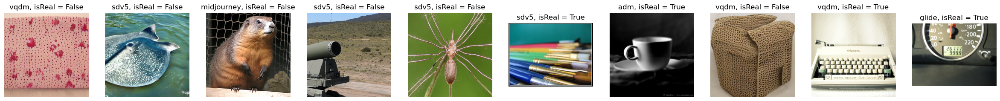

In [108]:
plot_pictures(df_corrected_10max, col=10)

In [109]:
df_incorrected_10min = df_changed_class_incorrect.sort_values(by=['delta_output'], ascending=True)[['image_path', 'generator', 'real_or_fake', 'fire_output', 'blip_output', 'delta_output']].iloc[:10]
df_incorrected_10min

,image_path,generator,real_or_fake,fire_output,blip_output,delta_output
2658,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,0,-7.566247,0.122433,-7.688680
4281,/kaggle/input/tiny-genimage/imagenet_ai_0419_v...,vqdm,1,5.259313,-2.351835,-7.611148
3498,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-6.651055,0.607483,-7.258538
6518,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,5.359326,-1.334660,-6.693986
3026,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,0,-6.594298,0.065057,-6.659355
6368,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,5.712605,-0.784228,-6.496832
4508,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,4.232585,-2.232475,-6.465060
6588,/kaggle/input/tiny-genimage/imagenet_midjourne...,midjourney,1,5.068865,-0.981266,-6.050131
6230,/kaggle/input/tiny-genimage/imagenet_glide/val...,glide,1,4.730260,-1.280479,-6.010739
4990,/kaggle/input/tiny-genimage/imagenet_ai_0424_s...,sdv5,1,4.635922,-1.114904,-5.750826


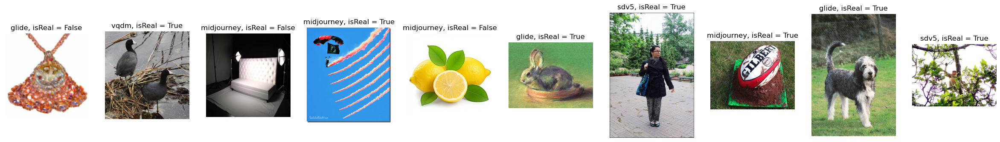

In [110]:
plot_pictures(df_incorrected_10min, col=10)

### 6.5 Masks visualization

In [111]:
df_sample = df_standard.sample(10)